In [5]:
import scanpy as sc
from matplotlib import rcParams
sc.settings.set_figure_params(dpi=200, frameon=False, figsize=(10, 10), facecolor='white')  # low dpi (dots per inch) yields small inline figures
adata = sc.read_csv('haem_coord.csv')

In [6]:
import pandas as pd
meta = pd.read_csv('haem_meta.csv')

In [7]:
adata.obs = meta

In [65]:
adata

AnnData object with n_obs × n_vars = 15875 × 50
    obs: 'Unnamed: 0', 'cell', 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'leiden'
    uns: 'neighbors', 'umap', 'stage_colors', 'haem_subclust_colors', 'leiden', 'paga', 'leiden_sizes', 'da_out', 'land'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [8]:
sc.pp.neighbors(adata, n_neighbors=10)
sc.tl.umap(adata)

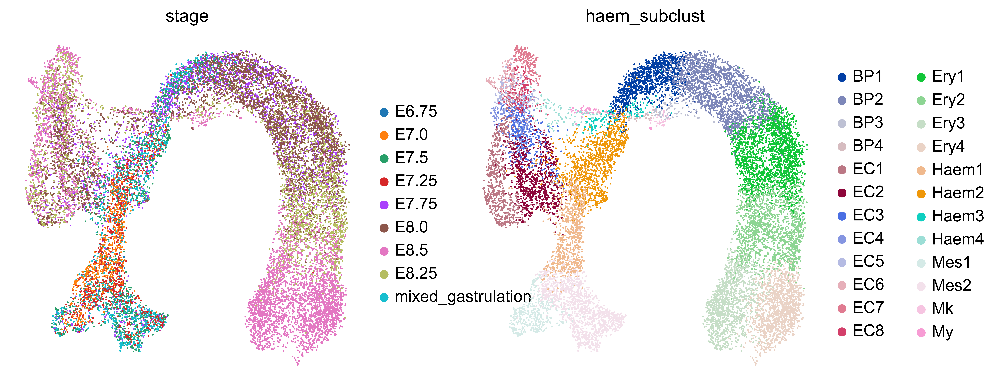

In [63]:
import matplotlib.pyplot as plt
sc.settings.set_figure_params(dpi=500, frameon=False, figsize=(5, 5), facecolor='white')  # low dpi (dots per inch) yields small inline figures
fig = sc.pl.umap(adata,color = ['stage','haem_subclust'],return_fig = True,save = 'haem_umap.pdf')

In [64]:
fig.savefig('haem_umap.pdf')

In [53]:
sc.pp.neighbors(adata, n_neighbors=10)
sc.tl.leiden(adata, resolution=1.0)
sc.tl.paga(adata, groups='leiden')

NameError: name 'size' is not defined

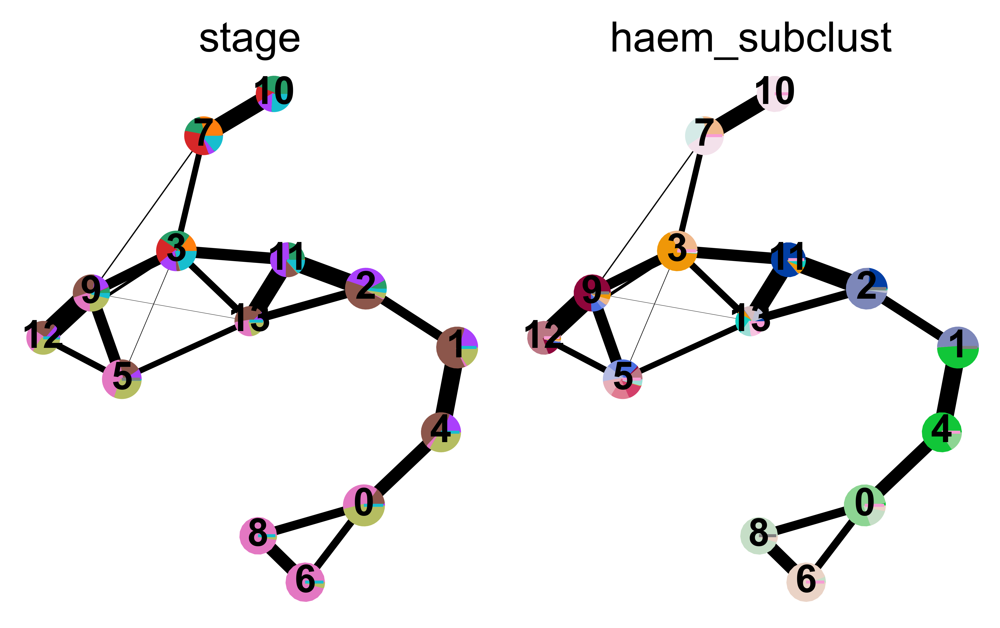

In [57]:
sc.settings.set_figure_params(dpi=500, frameon=False, figsize=(3, 3), facecolor='white')  # low dpi (dots per inch) yields small inline figures
sc.pl.paga(adata, color=['stage','haem_subclust'],save = 'haem_paga.pdf')

In [52]:
help(sc.pl.paga)

Help on function paga in module scanpy.plotting._tools.paga:

paga(adata: anndata._core.anndata.AnnData, threshold: Union[float, NoneType] = None, color: Union[str, Mapping[Union[str, int], Mapping[Any, float]], NoneType] = None, layout: Union[scanpy._compat.Literal_, NoneType] = None, layout_kwds: Mapping[str, Any] = mappingproxy({}), init_pos: Union[numpy.ndarray, NoneType] = None, root: Union[int, str, Sequence[int], NoneType] = 0, labels: Union[str, Sequence[str], Mapping[str, str], NoneType] = None, single_component: bool = False, solid_edges: str = 'connectivities', dashed_edges: Union[str, NoneType] = None, transitions: Union[str, NoneType] = None, fontsize: Union[int, NoneType] = None, fontweight: str = 'bold', fontoutline: Union[int, NoneType] = None, text_kwds: Mapping[str, Any] = mappingproxy({}), node_size_scale: float = 1.0, node_size_power: float = 0.5, edge_width_scale: float = 1.0, min_edge_width: Union[float, NoneType] = None, max_edge_width: Union[float, NoneType] = N

In [15]:
import importlib
import pyMuTrans as pm
importlib.reload(pm)
par = {"choice_distance":"cosine","K_cluster":12.0,"trials":100,"weight_scale":True,"initial":"pca","reduction_coord":"umap","reduce_large_scale":True,"reduce_num_meta_cell":1500.0} 
adata = pm.dynamical_analysis(adata,par)

/Users/cliffzhou/opt/anaconda3/lib/python3.7/site-packages/pyemma/__init__.py:92: UserWarning: You are not using the latest release of PyEMMA. Latest is 2.5.7, you have 2.5.6.
  .format(latest=latest, current=current), category=UserWarning)


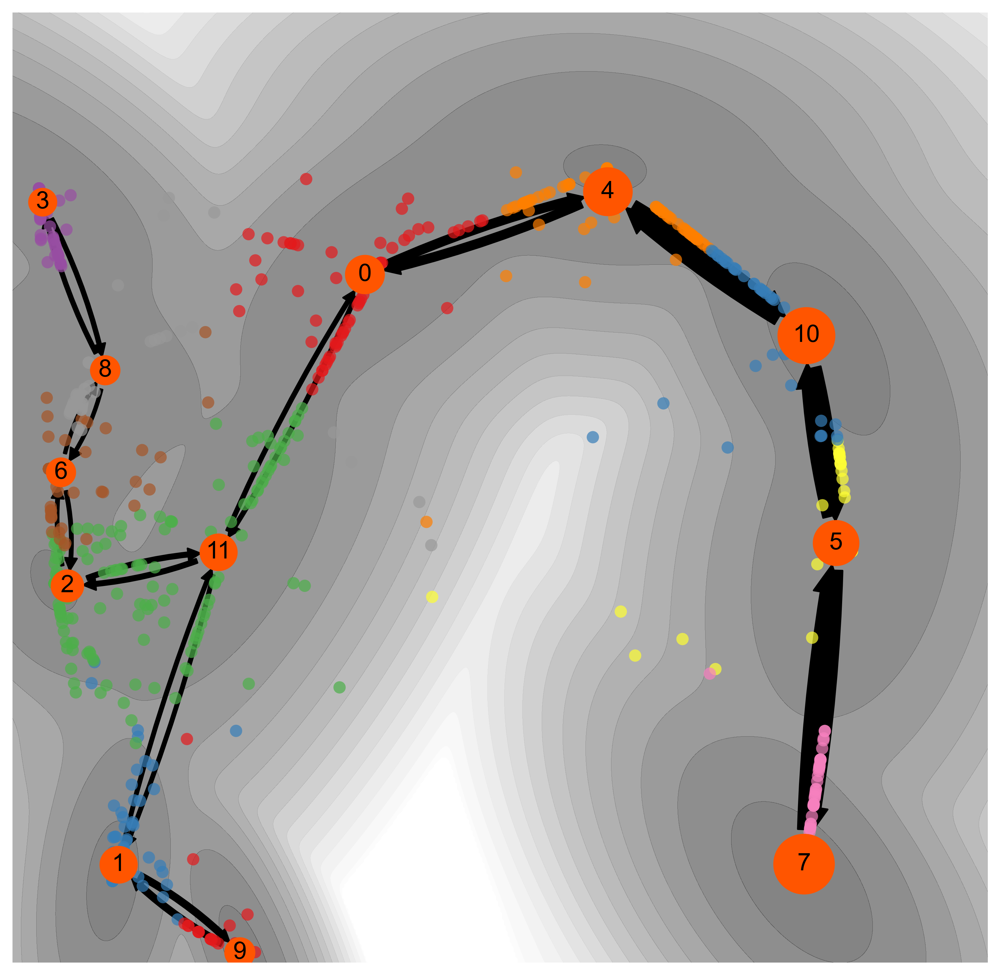

In [21]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (10,10))
pm.infer_lineage(adata,si=0,sf = 2,method = "MPFT",size_state = 0.2,size_text=16,alpha_point = 0.7)

In [22]:
fig.savefig('haem_mpft.pdf')

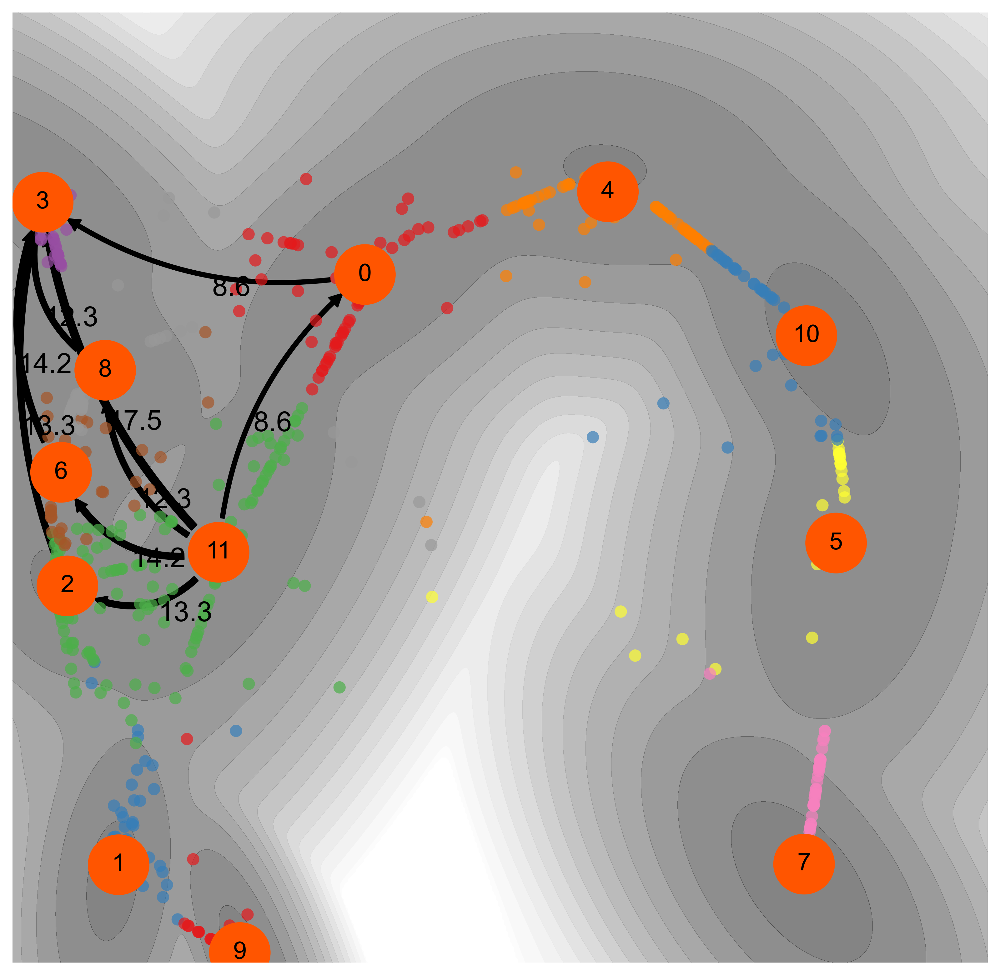

In [34]:
fig = plt.figure(figsize = (10,10))
pm.infer_lineage(adata,si=11,sf = 3,method = "MPPT",flux_fraction = 0.6,size_state = 0.2,size_text=16,alpha_point = 0.7)
fig.savefig('haem_mppt_ec.pdf')

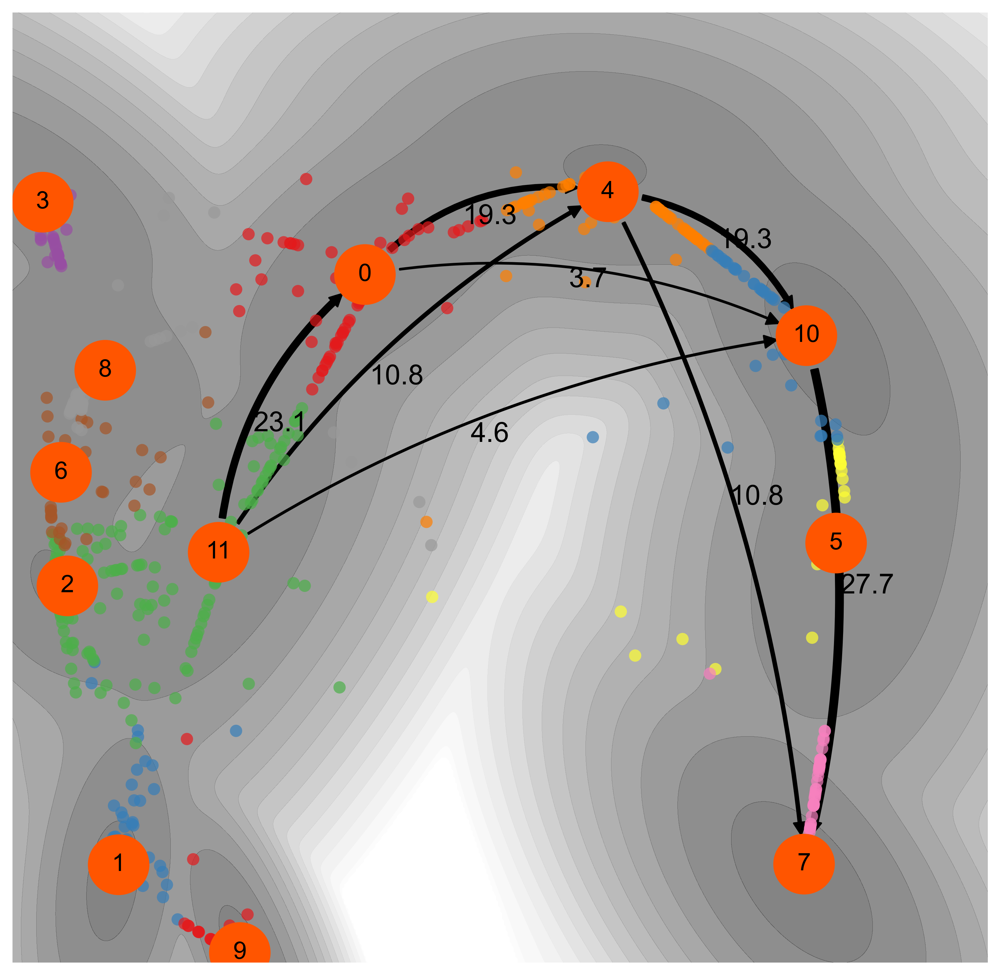

In [35]:
fig = plt.figure(figsize = (10,10))
pm.infer_lineage(adata,si=11,sf = 7,method = "MPPT",flux_fraction = 0.35,size_state = 0.2,size_text=16,alpha_point = 0.7)
fig.savefig('haem_mppt_eryth.pdf')